In [1]:
import math
from typing import Dict, List, Tuple
import IPython.display as ipd

import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import torch
from tqdm import tqdm
from torch import Tensor, nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader

from unet import UNet, UNet2
from data import musdbDataset
from splitter import Splitter

# %load_ext autoreload
# %autoreload 2
# %reload_ext autoreload

In [2]:
# Load Test Audio
wav_, _ = librosa.load(
    "/home/ytang363/7100_spr2023/audio/Im Alright Mixture.wav",
    mono=False,
    res_type="kaiser_fast",
    sr=44100,
    duration=15,
    offset=0,
)
wav_vocals_, _ = librosa.load(
    "/home/ytang363/7100_spr2023/audio/Im Alright Vocals.wav",
    mono=False,
    res_type="kaiser_fast",
    sr=44100,
    duration=15,
    offset=0,
)

wav = torch.Tensor(wav_).to("cuda")
wav_vocals = torch.Tensor(wav_vocals_).to("cuda")

funct = Splitter(stem_names=["vocals"])
stft, stft_mag, phase_mix = funct.compute_stft(wav)
stft_vocals, stft_vocals_mag, stft_voclas_phase = funct.compute_stft(wav_vocals)
print(wav_.shape)
ipd.Audio(wav_, rate=44100) 

(2, 661500)


In [3]:
# Load weights
model = Splitter(stem_names=["vocals","accompaniment"])
state_dict = torch.load("/home/ytang363/7100_spr2023/model/20230418-05_ep-600_b-8.pt")
model.load_state_dict(state_dict["model_state_dict"])
predict = model(wav)

state_dict2 = torch.load("/home/ytang363/7100_spr2023/model/20230325-16_ep-1000_b-16.pt")
model.load_state_dict(state_dict2["model_state_dict"])
predict2 = model(wav)

In [4]:
def apply_mask(predict, stft_input):
    mask_sum = sum([m**2 for m in predict.values()])
    mask_sum += 1e-10

    mask = (predict['vocals']**2 + 1e-10 / 2) / (mask_sum)
    mask = mask.transpose(2, 3)
    # print(mask.shape)

    mask = torch.cat(torch.split(mask, 1, dim=0), dim=3)
    mask = mask.squeeze(0)[:, :, :stft_input.size(2)].unsqueeze(-1) # 2 x F x L x 1
    # print(mask.shape)

    # Plot masked instrumental
    stft_masked = stft_input * mask
    print(stft_masked.shape)
    return stft_masked, stft_masked.cpu().detach().numpy()[0][:, :, 0]

def apply_mask_new(predict, stft_mag, phase_mix):
    mask_sum = sum([m**2 for m in predict.values()])
    mask_sum += 1e-10

    mask = (predict['vocals']**2 + 1e-10 / 2) / (mask_sum)
    mask = mask.transpose(2, 3)
    # print(mask.shape)

    mask = torch.cat(torch.split(mask, 1, dim=0), dim=3)

    # mask = mask.squeeze(0)[:, :, :L].unsqueeze(-1)  # 2 x F x L x 1
    mask = mask.squeeze(0)[:, :, :stft_mag.size(2)]
    src_magnitude = stft_mag * mask
    stft_masked = src_magnitude * torch.exp(1j * phase_mix)
    print(stft_masked.shape)
    return stft_masked, stft_masked.cpu().detach().numpy()[0][:,:]

In [5]:
stft_masked, test = apply_mask_new(predict, stft_mag, phase_mix)
print(test.shape)
stft_masked, test = apply_mask(predict, stft)
print(test.shape)

torch.Size([2, 1024, 646])
(1024, 646)
torch.Size([2, 1024, 646, 2])
(1024, 646)


torch.Size([2, 1024, 646])
torch.Size([2, 1024, 646])


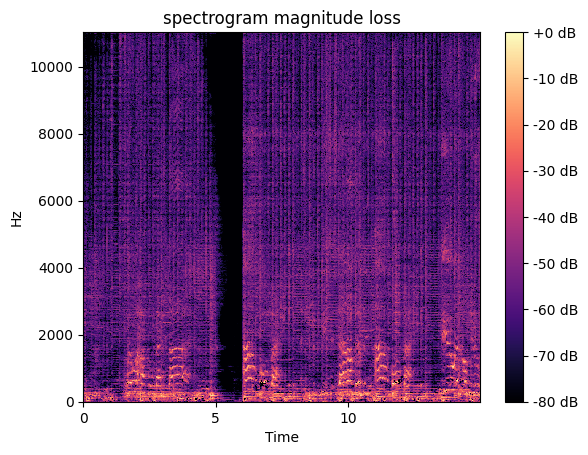

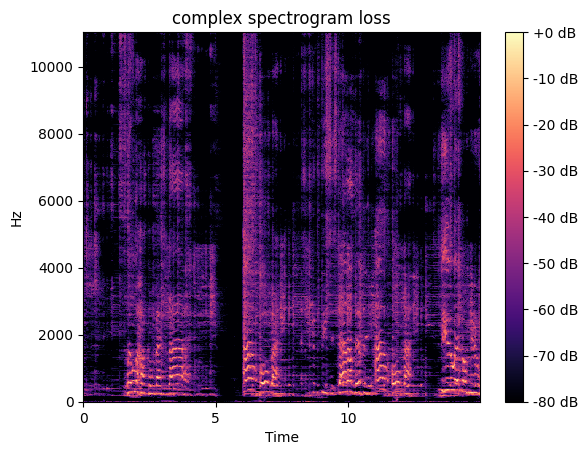

In [6]:
# stft_masked, test = apply_mask(predict, stft)
stft_masked, test = apply_mask_new(predict, stft_mag, phase_mix)
S_db = librosa.amplitude_to_db(np.abs(test), ref=np.max)
# stft_masked2, test2 = apply_mask(predict2, stft)
stft_masked2, test2 = apply_mask_new(predict2, stft_mag, phase_mix)
S_db2 = librosa.amplitude_to_db(np.abs(test2), ref=np.max)

fig, ax = plt.subplots()
img = librosa.display.specshow(S_db, x_axis='time', y_axis='linear', ax=ax)
ax.set(title='spectrogram magnitude loss')
fig.colorbar(img, ax=ax, format="%+2.f dB")

fig, ax = plt.subplots()
img = librosa.display.specshow(S_db2, x_axis='time', y_axis='linear', ax=ax)
ax.set(title='complex spectrogram loss')
fig.colorbar(img, ax=ax, format="%+2.f dB")

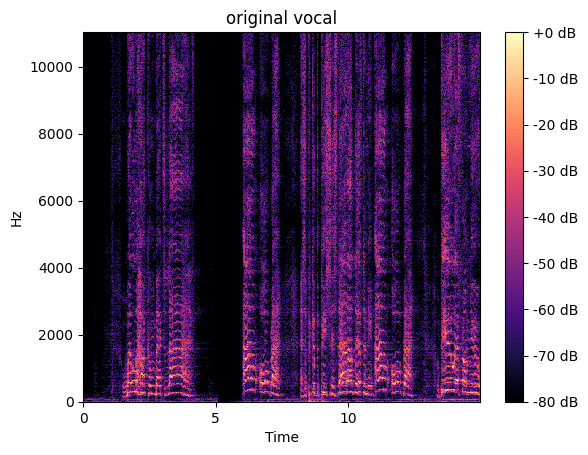

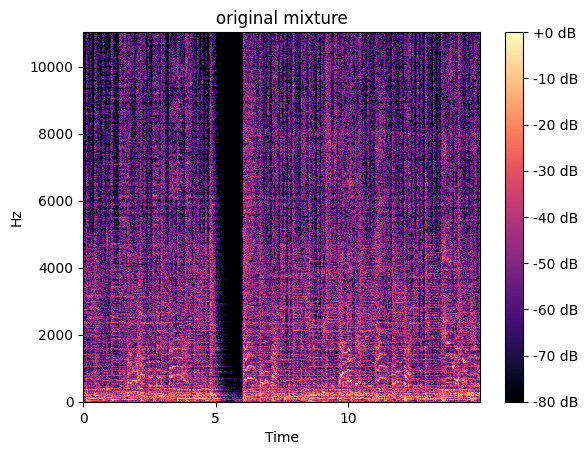

In [7]:
# Plot original vocals
original_vocal = stft_vocals.cpu().detach().numpy()[0][:, :, 0]
S_db2 = librosa.amplitude_to_db(np.abs(original_vocal), ref=np.max)

fig2, ax2 = plt.subplots()
img = librosa.display.specshow(S_db2, x_axis='time', y_axis='linear', ax=ax2)
ax2.set(title='original vocal')
fig2.colorbar(img, ax=ax2, format="%+2.f dB")

# Plot original mixture
original_mix = stft.cpu().detach().numpy()[0][:, :, 0]
S_db3 = librosa.amplitude_to_db(np.abs(original_mix), ref=np.max)

fig3, ax3 = plt.subplots()
img = librosa.display.specshow(S_db3, x_axis='time', y_axis='linear', ax=ax3)
ax3.set(title='original mixture')
fig3.colorbar(img, ax=ax3, format="%+2.f dB")

In [8]:
# 600 epochs
funct = Splitter(stem_names=["vocals"])
output = funct.inverse_stft(stft_masked)
output = output.cpu().detach().numpy()
print(output.shape)
ipd.Audio(output, rate=44100) 

(2, 660480)


In [9]:
# 600 epochs
funct = Splitter(stem_names=["vocals"])
output = funct.inverse_stft(stft_masked2)
output = output.cpu().detach().numpy()
print(output.shape)
ipd.Audio(output, rate=44100) 

(2, 660480)


In [11]:
estimated_stft = stft_masked
estimated_stft2 = stft_masked2
target_stft = funct.compute_stft(wav_vocals)[0]
mixture_stft = funct.compute_stft(wav)[0]
print(estimated_stft.shape)
print(target_stft.shape)

loss = torch.nn.functional.mse_loss(estimated_stft, target_stft)
print(loss)
loss2 = torch.nn.functional.mse_loss(estimated_stft2, target_stft)
print(loss2)
loss_worst = torch.nn.functional.mse_loss(mixture_stft, target_stft)
print(loss_worst)

torch.Size([2, 1024, 646])
torch.Size([2, 1024, 646, 2])


/tmp/ipykernel_1932995/1095000501.py:8: UserWarning: Using a target size (torch.Size([2, 1024, 646, 2])) that is different to the input size (torch.Size([2, 1024, 646])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss = torch.nn.functional.mse_loss(estimated_stft, target_stft)


RuntimeError: The size of tensor a (646) must match the size of tensor b (2) at non-singleton dimension 3